# 09 Exercises 1: Intro and Global Climatology

UW Geospatial Data Analysis  
CEE467/CEWA567  
David Shean  

## Objectives
* Introduce xarray data model for N-d array analysis
* Practice basic N-d array slicing, grouping and aggregation
* Explore global and local climate reanalysis data

In [ ]:
import os
from glob import glob
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import holoviews as hv

# Part 1: Global climatology
## Monthly temperature from 1979-2021
* Two datasets are provided:
    1. Climatology - long-term mean monthly values ofrom 1979-2021 (12 grids)
    2. Anomaly - monthly difference from long-term monthly mean (505 grids from 1979-2021)
* https://cds.climate.copernicus.eu/cdsapp#!/dataset/ecv-for-climate-change?tab=overview
* http://datastore.copernicus-climate.eu/c3s/published-forms/c3sprod/ecv-for-climate-change/PUG-ecv-for-climate-change.pdf

In [ ]:
%pwd

'/home/jovyan/gda_course_2022_solutions/modules/09_NDarrays_xarray_ERA5'

## Open the processed global monthly temperature anomaly and climatology NetCDF files
* See relevant doc on opening and writing files: http://xarray.pydata.org/en/stable/io.html
* Note that processing and saving the anomalies could take some time, as you're reading in 480 files and saving a large nc file
* Take a moment to review the steps in the `grib2nc` function of the download notebook, and review the io doc for xarray
    * Note the `open_dataset` and `concat` functions

In [ ]:
outdir = 'era5_data'

In [ ]:
t_clim_fn = os.path.join(outdir, 'climatology_0.25g_ea_2t.nc')
t_clim_ds = xr.open_dataset(t_clim_fn)

In [ ]:
t_anom_fn = os.path.join(outdir, '1month_anomaly_Global_ea_2t.nc') 
t_anom_ds = xr.open_dataset(t_anom_fn, chunks='auto')

## Inspect the DataSets
* Discuss with your neighbor
* Review the output of the `info()` method
* Note the number of time entries in each DataSet
* What are the min and max longitude, min and max latitude
* Note: The timestamp listed in the climatology dataset for each month is arbitrarily listed as 2018 (e.g., '2018-01-01')
    * Remember these are mean values for each month of the year (12 total) across the entire 1979-2021 period
* print info for the 't2m' DataArray (temperature 2 m above ground)

In [ ]:
t_clim_ds

<xarray.Dataset>
Dimensions:    (time: 12, latitude: 721, longitude: 1440)
Coordinates:
  * time       (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2022-02-28T07:58 GRIB to CDM+CF via cfgrib-0.9.1...

In [ ]:
t_anom_ds

<xarray.Dataset>
Dimensions:    (time: 517, latitude: 721, longitude: 1440)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01 1979-02-01 ... 2022-01-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 dask.array<chunksize=(222, 312, 480), meta=np.ndarray>
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2022-02-28T07:59 GRIB to CDM+CF via cfgrib-0.9.1...

## Convert the temperature values from K to C for the climatology dataset
* Note: don't need to do this for anomalies, as they are relative values, not absolute
* These operations are done on the DataArray level (not the top-level DataSet object level), so you'll need to modify `t_clim_ds['t2m']`
    * You can use `-=` syntax here
    * Or, update the `t_clim_ds['t2m'].values`
* Make sure you also update the units
    * The units used by xarray are stored in the t_clim_ds['t2m'].attrs dictionary
    * There is also a GRIB units variable, but this is holdover from the grib to xarray conversion
* Sanity check values

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

{'GRIB_paramId': 167,
 'GRIB_dataType': 'an',
 'GRIB_numberOfPoints': 1038240,
 'GRIB_typeOfLevel': 'surface',
 'GRIB_stepUnits': 1,
 'GRIB_stepType': 'avgua',
 'GRIB_gridType': 'regular_ll',
 'GRIB_NV': 0,
 'GRIB_Nx': 1440,
 'GRIB_Ny': 721,
 'GRIB_cfName': 'unknown',
 'GRIB_cfVarName': 't2m',
 'GRIB_gridDefinitionDescription': 'Latitude/Longitude Grid',
 'GRIB_iDirectionIncrementInDegrees': 0.25,
 'GRIB_iScansNegatively': 0,
 'GRIB_jDirectionIncrementInDegrees': 0.25,
 'GRIB_jPointsAreConsecutive': 0,
 'GRIB_jScansPositively': 0,
 'GRIB_latitudeOfFirstGridPointInDegrees': 90.0,
 'GRIB_latitudeOfLastGridPointInDegrees': -90.0,
 'GRIB_longitudeOfFirstGridPointInDegrees': 0.0,
 'GRIB_longitudeOfLastGridPointInDegrees': 359.75,
 'GRIB_missingValue': 9999,
 'GRIB_name': '2 metre temperature',
 'GRIB_shortName': '2t',
 'GRIB_totalNumber': 0,
 'GRIB_units': 'C',
 'long_name': '2 metre temperature',
 'units': 'C',
 'standard_name': 'unknown',
 'coordinates': 'number time step surface latitude

## Set the longitude values to be (-180 to 180) instead of (0 to 360)
* Could also store as new set of coordinates called `longitude_180` or something

In [ ]:
def ds_swaplon(ds):
    return ds.assign_coords(longitude=(((ds.longitude + 180) % 360) - 180)).sortby('longitude')

In [ ]:
t_clim_ds = ds_swaplon(t_clim_ds)

In [ ]:
t_anom_ds = ds_swaplon(t_anom_ds)

/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/core/indexing.py:1227: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


In [ ]:
t_clim_ds.longitude

<xarray.DataArray 'longitude' (longitude: 1440)>
array([-180.  , -179.75, -179.5 , ...,  179.25,  179.5 ,  179.75])
Coordinates:
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8

## Isolate the August array and plot
* Review different strategies for selection here: http://xarray.pydata.org/en/stable/indexing.html
* Use the `isel` method with dimension name and integer index (`time=7`)
* Use the `sel` method with dimension name and label (`time='2016-08-01'`)
* Note: plot.imshow is much more efficient for regular grids, than the default plot contourf

In [ ]:
#See time dimension index
t_clim_ds.time

<xarray.DataArray 'time' (time: 12)>
array(['1981-01-01T00:00:00.000000000', '1981-02-01T00:00:00.000000000',
       '1981-03-01T00:00:00.000000000', '1981-04-01T00:00:00.000000000',
       '1981-05-01T00:00:00.000000000', '1981-06-01T00:00:00.000000000',
       '1981-07-01T00:00:00.000000000', '1981-08-01T00:00:00.000000000',
       '1981-09-01T00:00:00.000000000', '1981-10-01T00:00:00.000000000',
       '1981-11-01T00:00:00.000000000', '1981-12-01T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
Attributes:
    long_name:      initial time of forecast
    standard_name:  forecast_reference_time

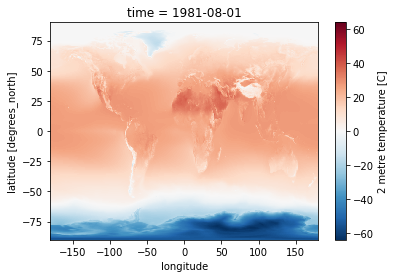

In [ ]:
#Student Exercise

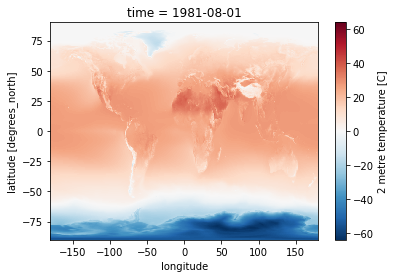

In [ ]:
#Student Exercise

## Create a plot for August, overlaying coastlines with cartopy
Use a simple PlateCaree() projection as in example here:
* https://scitools.org.uk/cartopy/docs/v0.15/matplotlib/intro.html

Once you have your axes setup, you should be able to plot with xarray easily (pass the axes object to `plot()` function:
* http://xarray.pydata.org/en/stable/plotting.html#maps  
Don't use a discrete color ramp as in some of the examples, use a continuous linear color ramp, as in the facet plot.

Note how 2-m temperature varies with elevation (e.g., see the Tibetan Plateau)

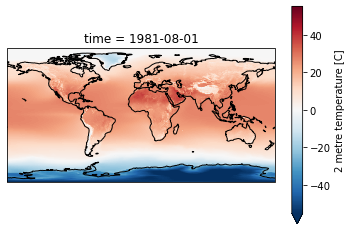

In [ ]:
f = plt.figure()
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines() 
t_clim_ds['t2m'].sel(time=ts).plot.imshow(ax=ax, robust=True);

## Create a Facet plot showing temperature grids for each month in the climatology DataSet
* http://xarray.pydata.org/en/stable/plotting.html#faceting
* Note that these plots can be memory hungry, and if you have other kernels running, this could fill RAM and cause kernel to stop
    * Could try isolating a smaller area to test (see slicing) then running on full dataset when satisfied
* Make sure your units are correct in the colorbar
* While they may look similar, each panel is slightly different
    * Take a moment to admire this, look at seasonal cycles

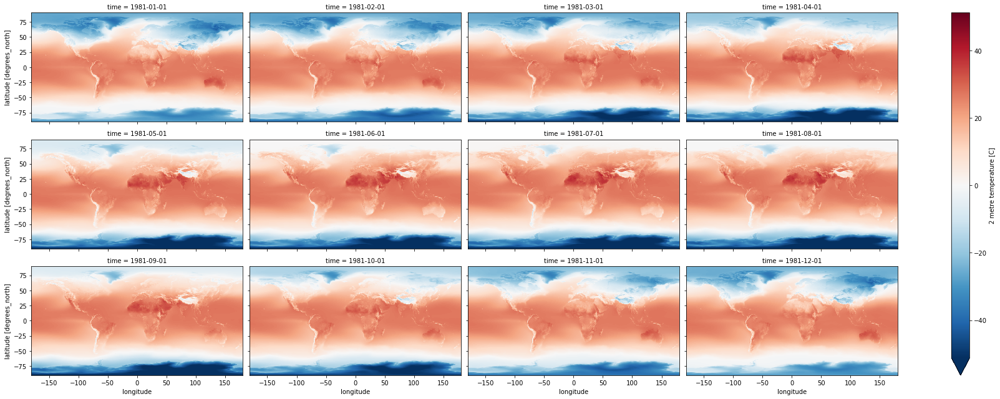

In [ ]:
#Student Exercise

## Use Holoviz for interactive plotting
* Multiple plotting backends can be used with xarray
    * We previously used Seaborn, and folium/ipyleaflet for interactive maps
* Still under development, but `hvplot` is flexible and powerful:
    * https://holoviz.org/

In [ ]:
import hvplot.xarray 

#### Create interactive plot with hvplot()
* Note how coordinates and values are interactively displayed as you move your cursor over the plot
* Experiment with time slider on right side
* Experiment with zoom/pan capability

In [ ]:
t_clim_ds['t2m'].hvplot(x='longitude',y='latitude', cmap='RdBu_r', clim=(-50,50))

:DynamicMap   [time]
   :Image   [longitude,latitude]   (t2m)

## Create line plot of global monthly temperature
* Compute the mean of the climatology t2m DataArray across the spatial dimensions
* Remember to pass `dim=('latitude', 'longitude')` so xarray knows over which dimensions to compute the mean!)

In [ ]:
#Not this! Gives a single value for full array
#t_clim_ds['t2m'].mean()

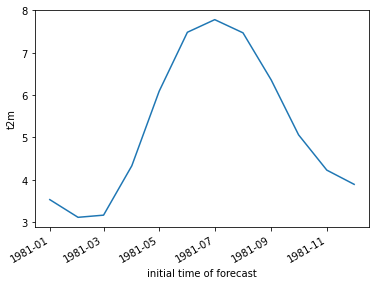

In [ ]:
#Student Exercise

## Create 2D plots showing mean temperature vs. latitude (averaged over all longitudes)

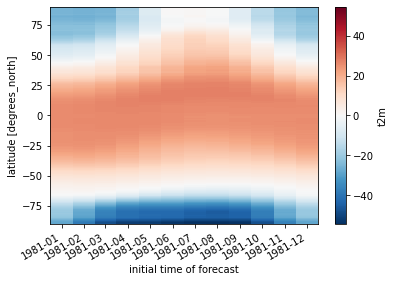

In [ ]:
#Student Exercise

## Create line plots of mean zonal and meridional temperature
* https://en.wikipedia.org/wiki/Zonal_and_meridional
* Hint: specify a tuple of appropriate dimensions for the `dim` keyword when computing `mean()`
    * Above we used `dim=('latitude', 'longitude')` to average all latitudes and longitudes, plotting the resulting values over time
    * Now in the zonal mean case, we want to average for all latitudes and times, plotting resulting values vs. longitude
* Create as figure with two subplots: meridional mean T and zonal mean T
* Add titles accordingly

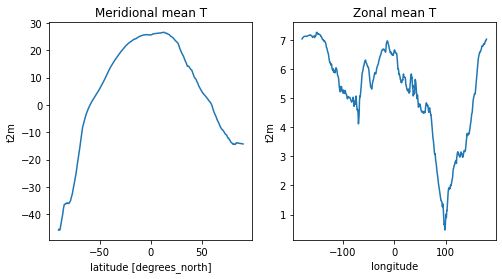

In [ ]:
#Student Exercise

## Create a plot showing monthly mean temperature for the Arctic and Antarctic
* See location indexing here: http://xarray.pydata.org/en/stable/indexing.html#assigning-values-with-indexing
* One approach:
    * Create boolean index arrays for `t_clim_ds['latitude']` coordinate for relevant latitude ranges
        * Use Arctic circle and Antarctic circle as a threshold
            * https://en.wikipedia.org/wiki/Arctic_Circle
    * Use the index array with xarray `where` method on the `t_clim_ds['t2m']` DataArray
        * Make sure to use `drop=True` to avoid unnecessarily storing lots of nan values in memory
    * Compute the mean across all returned lat/lon grid cells
* Note the magnitude and phase of the seasonal temperature varability at the opposite poles

In [ ]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_idx = (t_clim_ds['latitude'] >= polar_lat)
antarctic_idx = (t_clim_ds['latitude'] <= -polar_lat)
nonpolar_idx = (t_clim_ds['latitude'] < polar_lat) & (t_clim_ds['latitude'] > -polar_lat)

In [ ]:
#Sanity check
#arctic_idx[::10]
#antarctic_idx[::10]
#nonpolar_idx[::10]

In [ ]:
#Student Exercise

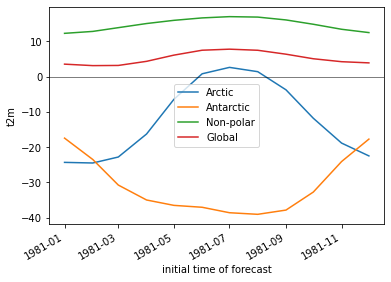

In [ ]:
#Student Exercise

## Extra Credit: Repeat the above analysis, isolating land and ocean classes
* Hint: can use `rioxarray` for clipping using a GeoDataFrame or geometry

### Open the world polygons

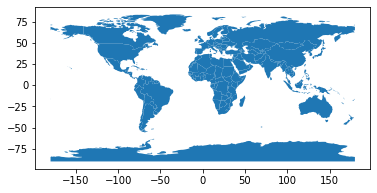

In [ ]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
#Hack to set to latest PROJ syntax, instead of 'init'
world.crs = 'EPSG:4326'
world.plot();

### Use `rioxarray` `clip` function
* Code and documentation is still under development, but you can read more here:
    * https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
    * https://corteva.github.io/rioxarray/stable/examples/clip_geom.html

In [ ]:
import rioxarray

In [ ]:
#Need to first set CRS
t_clim_ds.rio.write_crs(world.crs, inplace=True);

In [ ]:
print(t_clim_ds.spatial_ref)

<xarray.DataArray 'spatial_ref' ()>
array(0)
Coordinates:
    spatial_ref  int64 0
Attributes:
    crs_wkt:                      GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["...
    semi_major_axis:              6378137.0
    semi_minor_axis:              6356752.314245179
    inverse_flattening:           298.257223563
    reference_ellipsoid_name:     WGS 84
    longitude_of_prime_meridian:  0.0
    prime_meridian_name:          Greenwich
    geographic_crs_name:          WGS 84
    grid_mapping_name:            latitude_longitude
    spatial_ref:                  GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["...


In [ ]:
#Mask values over ocean
t_clim_ds_land = t_clim_ds['t2m'].rio.clip(world.geometry, crs=world.crs, drop=False)
#Invert to mask values over land
t_clim_ds_ocean = t_clim_ds['t2m'].rio.clip(world.geometry, crs=world.crs, drop=False, invert=True)

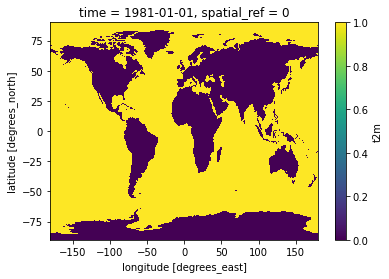

In [ ]:
#Preview land mask
t_clim_ds_land.isel(time=0).isnull().plot();

In [ ]:
print(t_clim_ds_land.spatial_ref)

<xarray.DataArray 'spatial_ref' ()>
array(0)
Coordinates:
    spatial_ref  int64 0
Attributes:
    crs_wkt:                      GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["...
    semi_major_axis:              6378137.0
    semi_minor_axis:              6356752.314245179
    inverse_flattening:           298.257223563
    reference_ellipsoid_name:     WGS 84
    longitude_of_prime_meridian:  0.0
    prime_meridian_name:          Greenwich
    geographic_crs_name:          WGS 84
    grid_mapping_name:            latitude_longitude
    spatial_ref:                  GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["...
    GeoTransform:                 -180.125 0.25 0.0 90.125 0.0 -0.25


### Side note: reprojecting with rioxarray
* First need to assigning a crs to the xarray dataset
    * We did this above `t_clim_ds.rio.write_crs(world.crs, inplace=True);`
* Can then use `xds.rio.reproject()`
* https://corteva.github.io/rioxarray/stable/examples/reproject.html

<xarray.DataArray 'spatial_ref' ()>
array(0)
Coordinates:
    time         datetime64[ns] 1981-08-01
    spatial_ref  int64 0
Attributes:
    crs_wkt:       PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["W...
    spatial_ref:   PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["W...
    GeoTransform:  -20037481.165179186 32074.29135072323 0.0 16294357.0062469...


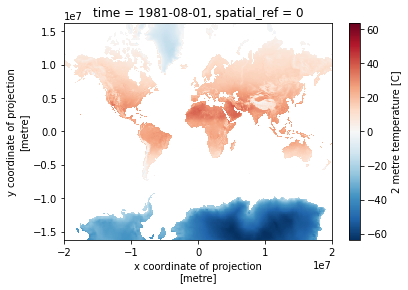

In [ ]:
reproj_test = t_clim_ds_land.isel(time=7).rio.reproject("EPSG:3857")
print(reproj_test.spatial_ref)
reproj_test.plot.imshow();

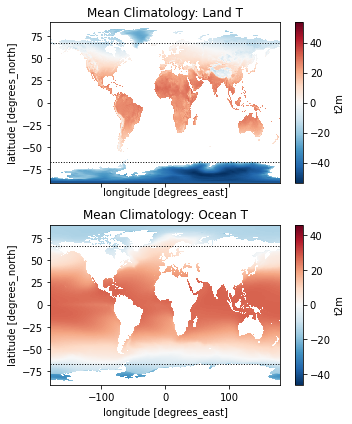

In [ ]:
f, axa = plt.subplots(2,1, sharex=True, sharey=True, figsize=(5,6))
t_clim_ds_land.mean(dim='time').plot(ax=axa[0], cmap='RdBu_r', clim=(-50,50))
t_clim_ds_ocean.mean(dim='time').plot(ax=axa[1], cmap='RdBu_r', clim=(-50,50))
axa[0].set_title('Mean Climatology: Land T')
axa[1].set_title('Mean Climatology: Ocean T')
kwargs = dict(color='k', lw=1.0, ls=':')
axa[0].axhline(polar_lat, **kwargs)
axa[0].axhline(-polar_lat, **kwargs)
axa[1].axhline(polar_lat, **kwargs)
axa[1].axhline(-polar_lat, **kwargs)
plt.tight_layout()

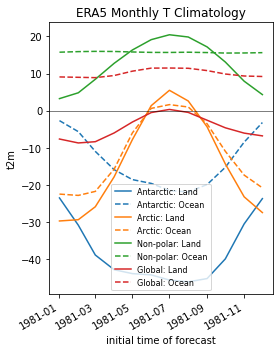

In [ ]:
f, ax = plt.subplots(figsize=(4,5))
t_clim_ds_land.where(antarctic_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C0', ls='-', label='Antarctic: Land')
t_clim_ds_ocean.where(antarctic_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C0', ls='--', label='Antarctic: Ocean')
t_clim_ds_land.where(arctic_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C1', ls='-', label='Arctic: Land')
t_clim_ds_ocean.where(arctic_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C1', ls='--', label='Arctic: Ocean')
t_clim_ds_land.where(nonpolar_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C2', ls='-', label='Non-polar: Land')
t_clim_ds_ocean.where(nonpolar_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C2', ls='--', label='Non-polar: Ocean')
t_clim_ds_land.mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C3', ls='-', label='Global: Land')
t_clim_ds_ocean.mean(dim=('latitude', 'longitude')).plot(ax=ax, color='C3', ls='--', label='Global: Ocean')
ax.axhline(0, color='k', lw=0.5)
ax.set_title('ERA5 Monthly T Climatology')
ax.legend(fontsize=8);

## Temporal Variability: Anomalies

I heard somewhere that climate change was a hoax.  Let's check.

To do this, we will use the monthly anomalies from 1979-present.

### Create a line plot of mean global monthly temperature anomaly from 1979-present
* This should be a simple one-liner
* Note: if you used xarray's default lazy load of the `nc` file, and this is the first time reading the entire `t_anom_ds` from disk, this may take ~20 seconds

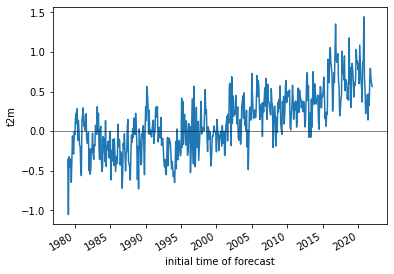

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

### Did the Arctic and Antarctic warm at the same rate over the past 40 years?
* Create a line plot showing anomalies for each region, you can reuse indices from above

/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/core/indexing.py:1227: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


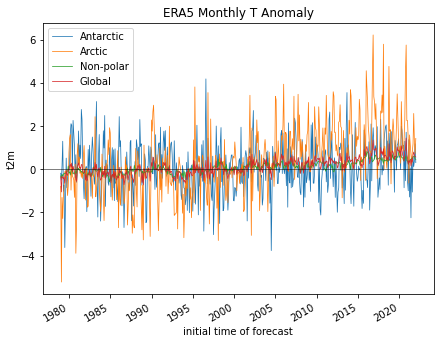

In [ ]:
f, ax = plt.subplots(figsize=(7,5))
kwargs = {'lw':0.75,'ls':'-'}
t_anom_ds['t2m'].where(antarctic_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, label='Antarctic', **kwargs)
t_anom_ds['t2m'].where(arctic_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, label='Arctic', **kwargs)
t_anom_ds['t2m'].where(nonpolar_idx, drop=True).mean(dim=('latitude', 'longitude')).plot(ax=ax, label='Non-polar', **kwargs)
t_anom_ds['t2m'].mean(dim=('latitude', 'longitude')).plot(ax=ax, label='Global', **kwargs)
ax.axhline(0, color='k', lw=0.5)
ax.set_title('ERA5 Monthly T Anomaly')
ax.legend();
#ax.set_xlim('2015-01-01','2019-01-01')

## Extra credit: compute linear temperature trend at each pixel and create a map with coastlines
* Note: can coarsen the data to 1x1° to improve performance (16x!)

In [ ]:
t_anom_ds.dims

Frozen({'time': 517, 'latitude': 721, 'longitude': 1440})

In [ ]:
ds_factor=4
t_anom_ds_1deg = t_anom_ds.coarsen(latitude=ds_factor, longitude=ds_factor, boundary='trim').mean()

In [ ]:
t_anom_ds_1deg.dims

Frozen({'time': 517, 'latitude': 180, 'longitude': 360})

In [ ]:
#Student Exercise

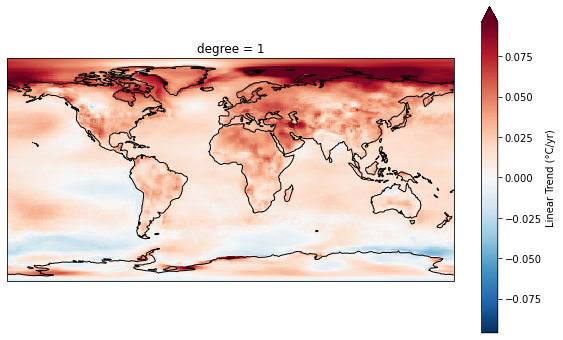

In [ ]:
#Student Exercise

## Extra credit: Group temperature anomalies by decade
* See pandas/xarray `resample` function
* Relevant aliases: https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#dateoffset-objects
* How does the most recent decade compare with the first decade in the time series?
    * Note that most first and last decade in the record might not be "complete" with 10 full years

In [ ]:
#Student Exercise

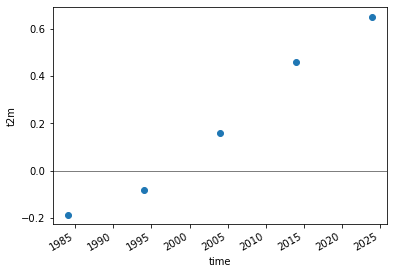

In [ ]:
#Student Exercise

## Clip to WA state

### Get the WA state outline

In [ ]:
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

In [ ]:
wa_state = states_gdf.loc[states_gdf['NAME'] == 'Washington']

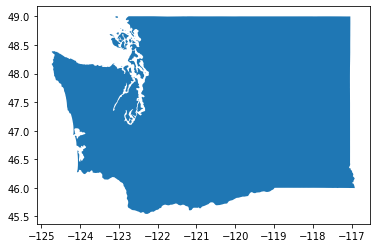

In [ ]:
wa_state.plot();

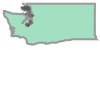

In [ ]:
wa_geom = wa_state.iloc[0].geometry
wa_geom

### Get rounded bounds on same grid as ERA5

In [ ]:
wa_bounds = wa_state.total_bounds
wa_bounds

array([-124.733174,   45.543541, -116.915989,   49.002494])

In [ ]:
def myround(x, base=0.25):
    return base * np.round(x/base)

def roundbounds(bounds, base=0.25):
    bounds_floor = np.floor(bounds/base)*base
    bounds_ceil = np.ceil(bounds/base)*base
    return [bounds_floor[0], bounds_floor[1], bounds_ceil[2], bounds_ceil[3]]

In [ ]:
wa_rbounds = roundbounds(wa_bounds)
wa_rbounds

[-124.75, 45.5, -116.75, 49.25]

### Clip with bounding box selection

In [ ]:
t_clim_ds_wa = t_clim_ds.sel(latitude=slice(wa_rbounds[3],wa_rbounds[1]), longitude=slice(wa_rbounds[0],wa_rbounds[2]))

In [ ]:
t_anom_ds_wa = t_anom_ds.sel(latitude=slice(wa_rbounds[3],wa_rbounds[1]), longitude=slice(wa_rbounds[0],wa_rbounds[2]))

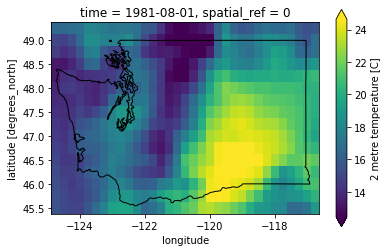

In [ ]:
f, ax = plt.subplots()
t_clim_ds_wa['t2m'].sel(time=ts).plot(ax=ax, robust=True);
wa_state.plot(ax=ax, edgecolor='k', facecolor='none');

## Extra credit: Compute linear temperature trend for WA state
* How does this compare with the global temperature trends?

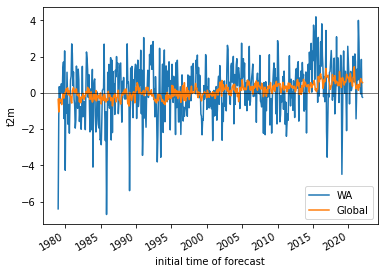

In [ ]:
#Student Exercise

In [ ]:
fit = t_anom_ds_wa['t2m'].polyfit(dim='time', deg=1)['polyfit_coefficients']
fit['degree'==1] *= dt_factor * 12
fit.name = 'Linear Trend (°C/yr)'

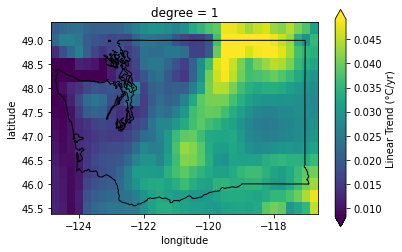

In [ ]:
f, ax = plt.subplots()
fit.sel(degree=1).plot(ax=ax, robust=True);
wa_state.plot(ax=ax, edgecolor='k', facecolor='none');